In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="white", context='poster')
import math

In [2]:
%load_ext autoreload
%autoreload 2


In [3]:
#from model_equations_separate_NC import *
from model_equations_separate_NC_store_numba import *


In [4]:
corder = ['C1', 'C2', 'C3', 'C4', 'C0']

In [5]:
morder = ['MIN', 'OVERFLOW', 'MIXOTROPH', 'EXOENZYME', 'ROS',]
media_order = ['lowN', 'pro99']
mpalette = 'twilight'
sns.color_palette(mpalette, n_colors=5)


[(0.4828677867260272, 0.6304330455306234, 0.761915371498953),
 (0.3668108554010799, 0.26404857724525643, 0.6464799165290824),
 (0.18488035509396164, 0.07942573027972388, 0.21307651648984993),
 (0.5566322903496934, 0.17269677158182117, 0.31423043195101424),
 (0.775907907306857, 0.5355421788246119, 0.42413367909988375)]

In [6]:
gorder = [ 'Strong', 'Sustained', 'Weak', 'Inhibited','Axenic' , 'Other']
gpalette = sns.color_palette('Set2', n_colors=4).as_hex() + ['black' , 'lightgrey']
sns.color_palette(gpalette)

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.0, 0.0, 0.0),
 (0.8274509803921568, 0.8274509803921568, 0.8274509803921568)]

In [7]:

HCOLOR = '#ffc58f'
HCOLOR_light = '#ffd2a9'
PCOLOR = '#99cc99'
PCOLOR_light = '#aad5aa'

DONCOLOR = '#7285b7'
RDONCOLOR = 'black' #'#00334D'
DINCOLOR = '#bbdaff' #'#000066'

DOCCOLOR = '#cc6666'
RDOCCOLOR = 'black' #'#00334D'
DICCOLOR = '#ff9da4' #'#000066'

SHCOLOR = '#ffa98f'
SPCOLOR = '#326232'


ccnpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR,DONCOLOR, RDONCOLOR, DINCOLOR]
ccnorder = ['Bp', 'Np', 'Bh','Nh',  'ABp', 'ABh', 'DON', 'RDON', 'DIN', ]
cccpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
cccorder = ['Bp[C]', 'Cp', 'Bh[C]', 'Ch', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
ccxpalette = [PCOLOR, HCOLOR]
ccxorder = ['Xp', 'Xh']
hnpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
hnorder = [ 'Bh', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
hcpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
hcorder = [ 'Bh[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
pnpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
pnorder = [ 'Bp', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
pcpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
pcorder = [ 'Bp[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
sns.color_palette(ccnpalette + cccpalette, )
# 


[(0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.4470588235294118, 0.5215686274509804, 0.7176470588235294),
 (0.0, 0.0, 0.0),
 (0.7333333333333333, 0.8549019607843137, 1.0),
 (0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.8, 0.4, 0.4),
 (0.0, 0.0, 0.0),
 (1.0, 0.615686274509804, 0.6431372549019608)]

In [8]:

 
sns.color_palette([PCOLOR, HCOLOR, PCOLOR_light, HCOLOR_light] )


[(0.6, 0.8, 0.6),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.8235294117647058, 0.6627450980392157)]

In [9]:
refdf = pd.read_excel('ML_model/reference_final.xlsx')

In [10]:
dpath = '/fast_data/Osnat/RECYCLE_MODEL/results/shgo2/out'
dpath = 'results'

In [11]:
os.listdir(dpath)

['monte_add_OVERFLOW_df.csv.gz',
 'monte_ponly_add_OVERFLOW_clean_df.csv.gz',
 'monte_ponly_clean_mse.csv.gz',
 'monte2_ponly_sum.csv.gz',
 'sensitivity_vmax2_df.csv.gz',
 'monte_ponly_clean_df.csv.gz',
 'monte_ponly_fix_OVERFLOW_df.csv.gz',
 'monte_het_minmse.csv.gz',
 'sensitivity_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_sum.csv.gz',
 'monte_add_het_mse.csv.gz',
 'monte_ponly_add_OVERFLOW_df.csv.gz',
 'monte_ponly_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_mse.csv.gz',
 'monte_ponly_fix_OVERFLOW_clean_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_df.csv.gz',
 'baseline_df.csv.gz',
 'results_old_26122023',
 'monte_het_clean_sum.csv.gz',
 'baseline_sum.csv.gz',
 'monte2_add_het_mse.csv.gz',
 'monte_strong_ponly_clean_df.csv.gz',
 'sensitivity_vmax2_sum.csv.gz',
 'monte_fix_OVERFLOW_mse.csv.gz',
 'monte_strong_ponly_sum.csv.gz',
 'monte_add_het_df.csv.gz',
 'sensitivity_vmax_mse.csv.gz',
 'monte_ponly_mse.csv.gz',
 'mon

In [12]:
pro99_mode = False 
which_organism = 'all'
organism_to_tune = 'HET'
(var_names, init_var_vals, intermediate_names, calc_dydt, prepare_params_tuple
) = get_constants_per_organism(pro99_mode, which_organism)
    


In [13]:
var_names

['Bp',
 'Np',
 'Cp',
 'Bh',
 'Nh',
 'Ch',
 'DON',
 'RDON',
 'DIN',
 'DOC',
 'RDOC',
 'DIC',
 'ROS']

In [14]:
dpath = 'results'
sim_df = pd.read_csv(os.path.join(dpath,'monte_het_clean_df.csv.gz',))


# sim_df = pd.concat([
#     sim_df1,
#     sim_df2,
# ])

In [15]:
#minmse_df = pd.read_csv(os.path.join(dpath,'monte_het_minmse.csv.gz',))

minmse_df = pd.read_csv('ML_model/monte_het_predicted_classes.csv.gz',)


In [16]:
minmse_df

,run_id,y_pred,max_prob,idx,media,which,model,hash,VPRO,VPRO_cluster,Unnamed: 0,Sample,full name,Group,RMSE_Bptotal[N],RMSE_Bptotal[C],compare_points,RMSE,RMSE_filled
0,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,Sustained,0.974799,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1,C1,1093634.0,6C0,Ruegeria pomeroyi,Sustained,5.163371,50.710373,74.0,261.836489,261.836489
1,monte_EXOENZYME_100_monte_vpro_12_88_EXOENZYME...,Weak,0.902784,monte_EXOENZYME_100_monte_vpro_12_88_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_12_88_EXOENZYME_C2,C2,150894.0,11A0,Roseovarius 5C3,Weak,4.621448,30.284159,74.0,139.956662,139.956662
2,monte_EXOENZYME_100_monte_vpro_13_4_EXOENZYME_...,Axenic,0.986157,monte_EXOENZYME_100_monte_vpro_13_4_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_4_EXOENZYME_C3,C3,72313.0,1B0,Axenic,Axenic,2.342476,52.057268,74.0,121.942887,121.942887
3,monte_EXOENZYME_100_monte_vpro_13_4_EXOENZYME_...,Axenic,0.986658,monte_EXOENZYME_100_monte_vpro_13_4_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_4_EXOENZYME_C3,C3,591130.0,1B0,Axenic,Axenic,2.137782,47.880754,74.0,102.358629,102.358629
4,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,362004.0,1A0,Axenic,Axenic,10.777020,70.798705,74.0,762.999051,762.999051
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49293,monte_ROS_9_monte_vpro_93_82_ROS_C1_64_lowN_al...,Weak,0.987644,monte_ROS_9_monte_vpro_93_82_ROS_C1_64,lowN,all,ROS,h-8660846992299669535,vpro_93_82_ROS_C1,C1,127611.0,11A0,Roseovarius 5C3,Weak,4.590178,37.560730,74.0,172.410439,172.410439
49294,monte_ROS_9_monte_vpro_96_60_ROS_C1_59_lowN_al...,Weak,0.990016,monte_ROS_9_monte_vpro_96_60_ROS_C1_59,lowN,all,ROS,h-8660846992299669535,vpro_96_60_ROS_C1,C1,1518623.0,10C0,Marinovum 5F3,Weak,2.031882,22.689852,74.0,46.103093,46.103093
49295,monte_ROS_9_monte_vpro_96_60_ROS_C1_66_lowN_al...,Weak,0.990016,monte_ROS_9_monte_vpro_96_60_ROS_C1_66,lowN,all,ROS,h-8660846992299669535,vpro_96_60_ROS_C1,C1,927500.0,10C0,Marinovum 5F3,Weak,2.074992,22.349891,74.0,46.375842,46.375842
49296,monte_ROS_9_monte_vpro_97_23_ROS_C1_3_lowN_all...,Weak,0.990016,monte_ROS_9_monte_vpro_97_23_ROS_C1_3,lowN,all,ROS,h-8660846992299669535,vpro_97_23_ROS_C1,C1,1466519.0,10C0,Marinovum 5F3,Weak,4.263308,36.547564,74.0,155.813533,155.813533


In [17]:
df = pd.merge(minmse_df, 
                  sim_df[['run_id', 'Bptotal[N]','Bptotal[C]','Bhtotal[N]','Bhtotal[C]','day'] + var_names], 
                  on='run_id', how='left')

In [18]:
df.columns

Index(['run_id', 'y_pred', 'max_prob', 'idx', 'media', 'which', 'model',
       'hash', 'VPRO', 'VPRO_cluster', 'Unnamed: 0', 'Sample', 'full name',
       'Group', 'RMSE_Bptotal[N]', 'RMSE_Bptotal[C]', 'compare_points', 'RMSE',
       'RMSE_filled', 'Bptotal[N]', 'Bptotal[C]', 'Bhtotal[N]', 'Bhtotal[C]',
       'day', 'Bp', 'Np', 'Cp', 'Bh', 'Nh', 'Ch', 'DON', 'RDON', 'DIN', 'DOC',
       'RDOC', 'DIC', 'ROS'],
      dtype='object')

In [19]:
df = df.reset_index(drop=True)

In [20]:
runids = minmse_df.groupby(['model', 'y_pred'])['run_id'].sample(100, replace=True)

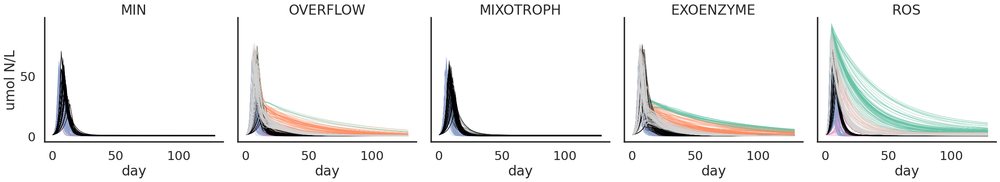

In [21]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids)],
    x='day',
    y='Bptotal[N]',
    hue='y_pred', hue_order=gorder,
    kind='line', lw=0.4,
    estimator=None, units='run_id', palette=gpalette,
    col='model', col_order=morder, #col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
g.set(ylabel='umol N/L')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)

#g.set(yscale='log', ylim=(1e-1, 300))
plt.show()

In [24]:
df['Bptotal[C]'].max()

879.7133517340353

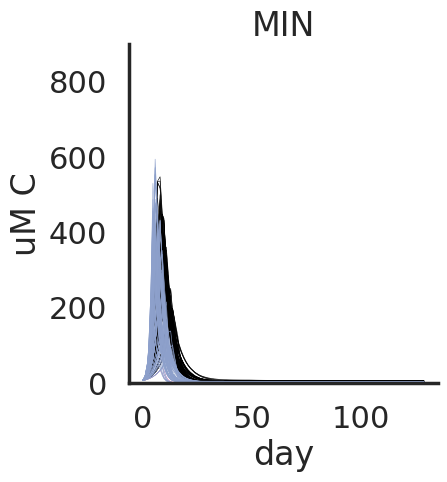

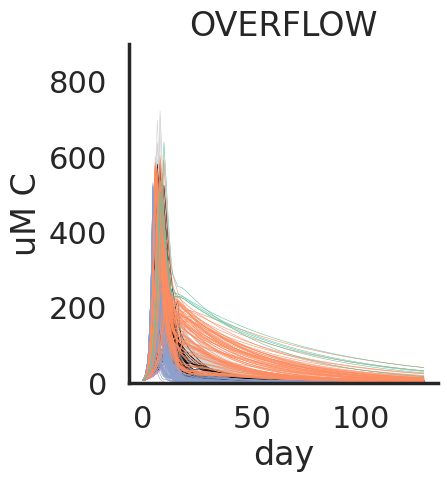

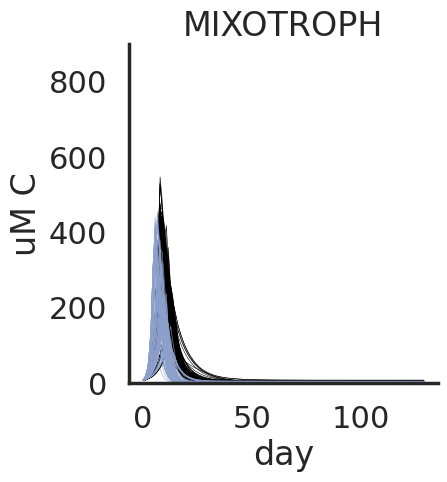

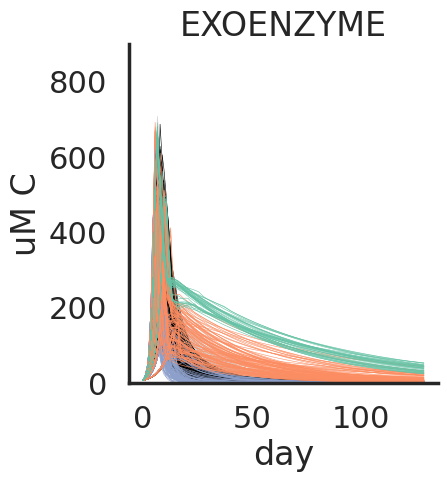

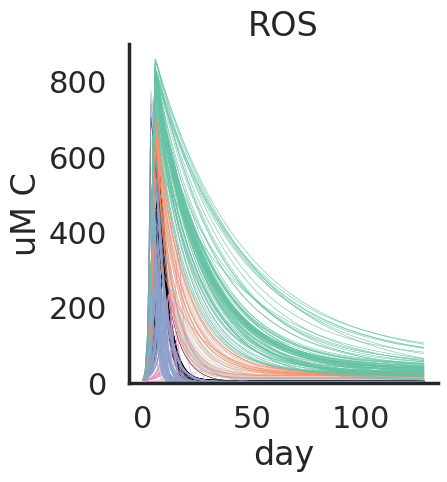

In [28]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
for m in morder:
    g = sns.relplot(
        data=df.loc[df.run_id.isin(runids) & df.model.isin([m])],
        x='day',
        y='Bptotal[C]',
        hue='y_pred', hue_order=reversed(gorder),
        kind='line', lw=0.4,
        estimator=None, units='run_id', palette=reversed(gpalette),
        #col='model', col_order=morder, #col_wrap=3,
        legend=False,
            #aspect=1, height=3,
        #facet_kws=dict(margin_titles=True)
    
    ).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
    g.set(ylabel='uM C', ylim=(0,900))
    plt.title(m)
    #plt.subplots_adjust(hspace=0.1, wspace=0.1)
    
    #g.set(yscale='log', ylim=(1e-1, 300))
    plt.show()

In [36]:
df

,run_id,y_pred,max_prob,idx,media,which,model,hash,VPRO,VPRO_cluster,...,RMSE_Bptotal[N],RMSE_Bptotal[C],compare_points,RMSE,RMSE_filled,Bptotal[N],Bptotal[C],Bhtotal[N],Bhtotal[C],day
0,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,Sustained,0.974799,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1,C1,...,5.163371,50.710373,74.0,261.836489,261.836489,0.892857,5.915179,28.571429,142.857143,0.000000
1,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,Sustained,0.974799,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1,C1,...,5.163371,50.710373,74.0,261.836489,261.836489,2.130678,15.012941,35.950534,136.354082,1.081944
2,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,Sustained,0.974799,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1,C1,...,5.163371,50.710373,74.0,261.836489,261.836489,4.654819,32.798006,32.261677,121.187172,2.164583
3,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,Sustained,0.974799,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1,C1,...,5.163371,50.710373,74.0,261.836489,261.836489,7.087345,49.935289,30.435697,119.267556,2.747222
4,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,Sustained,0.974799,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_11_62_EXOENZYME_C1,C1,...,5.163371,50.710373,74.0,261.836489,261.836489,14.653925,103.227359,32.608112,131.862838,3.754167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3651821,monte_ROS_9_monte_vpro_97_23_ROS_C1_5_lowN_all...,Weak,0.990229,monte_ROS_9_monte_vpro_97_23_ROS_C1_5,lowN,all,ROS,h-8660846992299669535,vpro_97_23_ROS_C1,C1,...,2.237044,18.039775,74.0,40.355763,40.355763,0.103334,0.892505,0.277243,1.170175,110.943750
3651822,monte_ROS_9_monte_vpro_97_23_ROS_C1_5_lowN_all...,Weak,0.990229,monte_ROS_9_monte_vpro_97_23_ROS_C1_5,lowN,all,ROS,h-8660846992299669535,vpro_97_23_ROS_C1,C1,...,2.237044,18.039775,74.0,40.355763,40.355763,0.102876,0.888576,0.275975,1.164830,115.845833
3651823,monte_ROS_9_monte_vpro_97_23_ROS_C1_5_lowN_all...,Weak,0.990229,monte_ROS_9_monte_vpro_97_23_ROS_C1_5,lowN,all,ROS,h-8660846992299669535,vpro_97_23_ROS_C1,C1,...,2.237044,18.039775,74.0,40.355763,40.355763,0.102603,0.886224,0.275216,1.161632,118.788889
3651824,monte_ROS_9_monte_vpro_97_23_ROS_C1_5_lowN_all...,Weak,0.990229,monte_ROS_9_monte_vpro_97_23_ROS_C1_5,lowN,all,ROS,h-8660846992299669535,vpro_97_23_ROS_C1,C1,...,2.237044,18.039775,74.0,40.355763,40.355763,0.102326,0.883842,0.274448,1.158394,121.777778


In [77]:
bestids =  minmse_df.loc[minmse_df.groupby(['model', 'y_pred']).RMSE_filled.idxmin()]

In [94]:
bestids =  minmse_df.loc[minmse_df.groupby(['model', 'y_pred']).max_prob.idxmax()]

In [95]:
bestids

,run_id,y_pred,max_prob,idx,media,which,model,hash,VPRO,VPRO_cluster,Unnamed: 0,Sample,full name,Group,RMSE_Bptotal[N],RMSE_Bptotal[C],compare_points,RMSE,RMSE_filled
863,monte_EXOENZYME_17_monte_vpro_77_45_EXOENZYME_...,Axenic,0.986949,monte_EXOENZYME_17_monte_vpro_77_45_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,vpro_77_45_EXOENZYME_C3,C3,608328.0,1A0,Axenic,Axenic,10.805722,104.828274,74.0,1132.745173,1132.745173
5146,monte_EXOENZYME_57_monte_vpro_13_69_EXOENZYME_...,Inhibited,0.392731,monte_EXOENZYME_57_monte_vpro_13_69_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,831880.0,3B0,Marinobacter adhaerens HP15,Inhibited,2.541588,23.491082,74.0,59.704651,59.704651
8466,monte_EXOENZYME_87_monte_vpro_75_68_EXOENZYME_...,Other,0.992618,monte_EXOENZYME_87_monte_vpro_75_68_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,vpro_75_68_EXOENZYME_C2,C2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
6347,monte_EXOENZYME_68_monte_vpro_24_46_EXOENZYME_...,Strong,0.652363,monte_EXOENZYME_68_monte_vpro_24_46_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,vpro_24_46_EXOENZYME_C3,C3,361896.0,5A0,Pseudoalteromonas haloplanktis,Strong,14.347789,149.272911,74.0,2141.736183,2141.736183
1395,monte_EXOENZYME_22_monte_vpro_13_69_EXOENZYME_...,Sustained,0.992382,monte_EXOENZYME_22_monte_vpro_13_69_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,1301271.0,7A0,Sulfitobacter pseudonitzschiae,Sustained,2.749766,20.349438,74.0,55.956203,55.956203
4806,monte_EXOENZYME_53_monte_vpro_67_63_EXOENZYME_...,Weak,0.990253,monte_EXOENZYME_53_monte_vpro_67_63_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,vpro_67_63_EXOENZYME_C2,C2,711754.0,11B0,Roseovarius 5C3,Weak,2.406716,18.084874,74.0,43.525149,43.525149
10515,monte_MIN_15_monte_vpro_60_20_MIN_C4_73_lowN_a...,Axenic,0.986732,monte_MIN_15_monte_vpro_60_20_MIN_C4_73,lowN,all,MIN,h-1541717058758371284,vpro_60_20_MIN_C4,C4,73599.0,1A0,Axenic,Axenic,4.932163,48.463287,74.0,239.028821,239.028821
15593,monte_MIN_62_monte_vpro_22_21_MIN_C2_94_lowN_a...,Inhibited,0.677099,monte_MIN_62_monte_vpro_22_21_MIN_C2_94,lowN,all,MIN,h-1541717058758371284,vpro_22_21_MIN_C2,C2,1240136.0,4C0,Phaeobacter gallaeciensis,Inhibited,0.262767,5.457816,74.0,1.434133,1.434133
16517,monte_MIN_70_monte_vpro_58_5_MIN_C2_23_lowN_al...,Weak,0.990324,monte_MIN_70_monte_vpro_58_5_MIN_C2_23,lowN,all,MIN,h-1541717058758371284,vpro_58_5_MIN_C2,C2,1414339.0,11B0,Roseovarius 5C3,Weak,2.571777,18.188103,74.0,46.775752,46.775752
24510,monte_MIXOTROPH_53_monte_vpro_62_58_MIXOTROPH_...,Axenic,0.986900,monte_MIXOTROPH_53_monte_vpro_62_58_MIXOTROPH_...,lowN,all,MIXOTROPH,h674153805448169520,vpro_62_58_MIXOTROPH_C3,C3,596355.0,1A0,Axenic,Axenic,5.658558,48.757592,74.0,275.897661,275.897661


In [96]:
bestdf = pd.merge(bestids, 
                  sim_df[['run_id', 'Bptotal[N]','Bptotal[C]','Bhtotal[N]','Bhtotal[C]','day'] + var_names], 
                  on='run_id', how='left')

In [97]:
bestdf.shape

(1702, 37)

In [98]:
mbestdf = bestdf.melt(
    id_vars = ['run_id', 'y_pred',  'model','Sample', 'day'],
    value_vars = ['Bptotal[C]',  'Bhtotal[C]'],
    #var_name = 'Strain',
    value_name = 'uM C',
)

In [99]:
mbestdf

,run_id,y_pred,model,Sample,day,variable,uM C
0,monte_EXOENZYME_17_monte_vpro_77_45_EXOENZYME_...,Axenic,EXOENZYME,1A0,0.000000,Bptotal[C],5.915179
1,monte_EXOENZYME_17_monte_vpro_77_45_EXOENZYME_...,Axenic,EXOENZYME,1A0,1.081944,Bptotal[C],10.975075
2,monte_EXOENZYME_17_monte_vpro_77_45_EXOENZYME_...,Axenic,EXOENZYME,1A0,2.164583,Bptotal[C],17.671901
3,monte_EXOENZYME_17_monte_vpro_77_45_EXOENZYME_...,Axenic,EXOENZYME,1A0,2.747222,Bptotal[C],22.821316
4,monte_EXOENZYME_17_monte_vpro_77_45_EXOENZYME_...,Axenic,EXOENZYME,1A0,3.754167,Bptotal[C],35.501528
...,...,...,...,...,...,...,...
3399,monte_ROS_20_monte_vpro_64_23_ROS_C2_76_lowN_a...,Weak,ROS,10A0,110.943750,Bhtotal[C],0.591700
3400,monte_ROS_20_monte_vpro_64_23_ROS_C2_76_lowN_a...,Weak,ROS,10A0,115.845833,Bhtotal[C],0.587903
3401,monte_ROS_20_monte_vpro_64_23_ROS_C2_76_lowN_a...,Weak,ROS,10A0,118.788889,Bhtotal[C],0.585637
3402,monte_ROS_20_monte_vpro_64_23_ROS_C2_76_lowN_a...,Weak,ROS,10A0,121.777778,Bhtotal[C],0.583345


In [100]:
mbestdf['Strain'] = mbestdf['variable'].map({'Bhtotal[C]': 'HET', 'Bptotal[C]':'PRO'})

In [116]:
bbestids = minmse_df.loc[minmse_df.groupby('y_pred').max_prob.idxmax()]
bbestids

,run_id,y_pred,max_prob,idx,media,which,model,hash,VPRO,VPRO_cluster,Unnamed: 0,Sample,full name,Group,RMSE_Bptotal[N],RMSE_Bptotal[C],compare_points,RMSE,RMSE_filled
863,monte_EXOENZYME_17_monte_vpro_77_45_EXOENZYME_...,Axenic,0.986949,monte_EXOENZYME_17_monte_vpro_77_45_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,vpro_77_45_EXOENZYME_C3,C3,608328.0,1A0,Axenic,Axenic,10.805722,104.828274,74.0,1132.745173,1132.745173
42485,monte_ROS_37_monte_vpro_97_23_ROS_C1_49_lowN_a...,Inhibited,0.988697,monte_ROS_37_monte_vpro_97_23_ROS_C1_49,lowN,all,ROS,h-8660846992299669535,vpro_97_23_ROS_C1,C1,498044.0,4C0,Phaeobacter gallaeciensis,Inhibited,0.123607,6.497550,74.0,0.803141,0.803141
43874,monte_ROS_50_monte_vpro_19_33_ROS_C0_11_lowN_a...,Other,0.993190,monte_ROS_50_monte_vpro_19_33_ROS_C0_11,lowN,all,ROS,h-8660846992299669535,vpro_19_33_ROS_C0,C0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
45454,monte_ROS_65_monte_vpro_19_33_ROS_C0_88_lowN_a...,Strong,0.987394,monte_ROS_65_monte_vpro_19_33_ROS_C0_88,lowN,all,ROS,h-8660846992299669535,vpro_19_33_ROS_C0,C0,1438152.0,5x5_21A0,A. macleodii ATCC27126,Strong,21.474462,239.838642,74.0,5150.405708,5150.405708
1395,monte_EXOENZYME_22_monte_vpro_13_69_EXOENZYME_...,Sustained,0.992382,monte_EXOENZYME_22_monte_vpro_13_69_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,1301271.0,7A0,Sulfitobacter pseudonitzschiae,Sustained,2.749766,20.349438,74.0,55.956203,55.956203
40680,monte_ROS_20_monte_vpro_64_23_ROS_C2_76_lowN_a...,Weak,0.990324,monte_ROS_20_monte_vpro_64_23_ROS_C2_76,lowN,all,ROS,h-8660846992299669535,vpro_64_23_ROS_C2,C2,1080729.0,10A0,Marinovum 5F3,Weak,2.022127,17.351743,74.0,35.087424,35.087424


In [117]:
mbestdf.loc[mbestdf.run_id.isin(bbestids.run_id) & mbestdf.Strain.isin(['PRO'])].Sample

0        1A0
1        1A0
2        1A0
3        1A0
4        1A0
        ... 
1697    10A0
1698    10A0
1699    10A0
1700    10A0
1701    10A0
Name: Sample, Length: 444, dtype: object

In [118]:
gorder

['Strong', 'Sustained', 'Weak', 'Inhibited', 'Axenic', 'Other']

In [119]:
mbestdf['y_pred1'] = mbestdf.y_pred
mbestdf.loc[mbestdf.y_pred.isin(['Axenic']),'y_pred1'] = 'Neutral'
gorder1 = ['Strong', 'Sustained', 'Weak', 'Inhibited', 'Neutral']

In [128]:
bbestids[['y_pred','full name']]

,y_pred,full name
863,Axenic,Axenic
42485,Inhibited,Phaeobacter gallaeciensis
43874,Other,NaN
45454,Strong,A. macleodii ATCC27126
1395,Sustained,Sulfitobacter pseudonitzschiae
40680,Weak,Marinovum 5F3


In [126]:
refdf[['Group','full name']].value_counts()

Group      full name                     
Axenic     Axenic                            222
Inhibited  Marinobacter adhaerens HP15       222
           Phaeobacter gallaeciensis         222
Strong     A. macleodii ATCC27126            222
           A. macleodii BS11                 222
           A. macleodii HOT1A3               222
           A. mediterranea AltDE             222
           A. mediterranea AltDE1            222
           Pseudoalteromonas haloplanktis    222
Sustained  Ruegeria pomeroyi                 222
           Sulfitobacter pseudonitzschiae    222
Weak       Marinovum 5F3                     222
           Roseovarius 5C3                   222
Name: count, dtype: int64

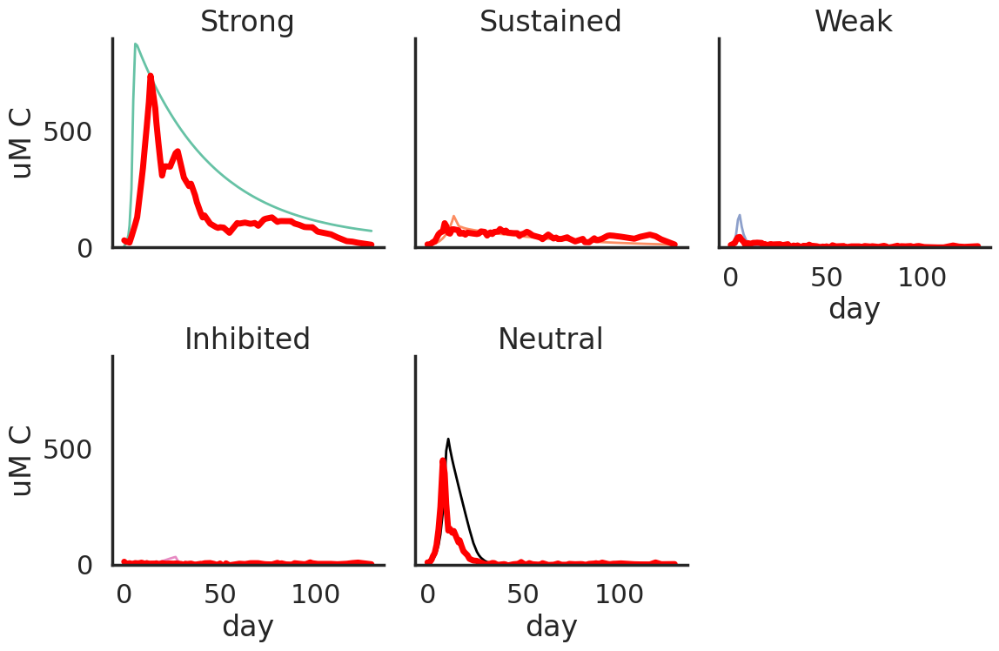

In [120]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
#for m in morder:
g = sns.relplot(
    data=mbestdf.loc[mbestdf.run_id.isin(bbestids.run_id) & mbestdf.Strain.isin(['PRO'])],
    x='day',
    y='uM C',
    hue='y_pred1', hue_order=gorder1, palette=gpalette[:-1],
    col='y_pred1', col_order=gorder1,
    kind='line', lw=2,
    legend=False,
        aspect=1, height=4,
    col_wrap=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
for col_val, ax in g.axes_dict.items():        
    
    data=mbestdf.loc[
        mbestdf.y_pred1.isin([col_val]) &
        mbestdf.model.isin([m]) 
    ]
    ref_samples = set(data['Sample'].mode())
    
    if ref_samples:
        sns.lineplot(
            data=refdf.loc[refdf.Sample.isin(ref_samples)],
            estimator=None, units='Sample',
            x='day', y=f'ref_Bp[C]', lw=5,
            legend=False,
            color='red',
            #zorder=-1,
            ax=ax,
        )

g.set(ylabel='uM C', ylim=(0,900))
#plt.suptitle(m, y=1.02)
#plt.subplots_adjust(hspace=0.1, wspace=0.1)

#g.set(yscale='log', ylim=(1e-1, 300))
plt.show()

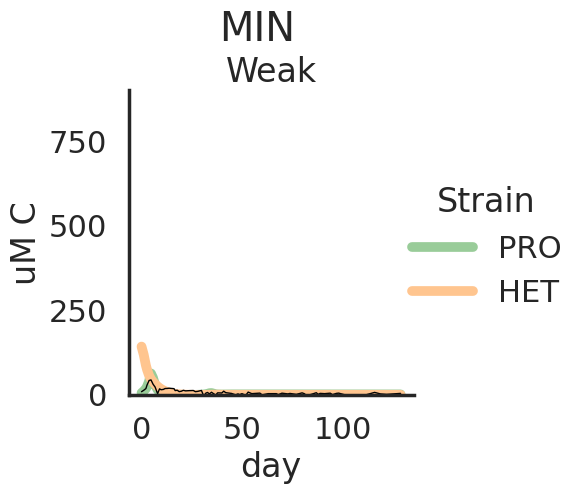

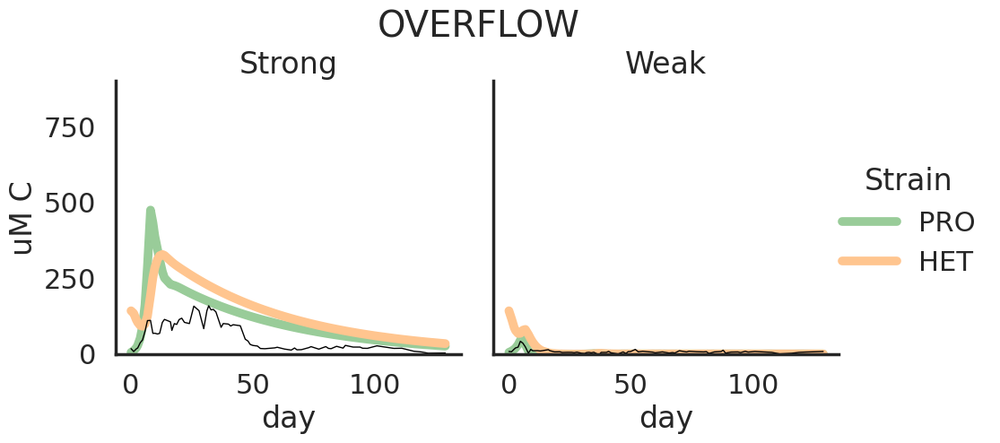

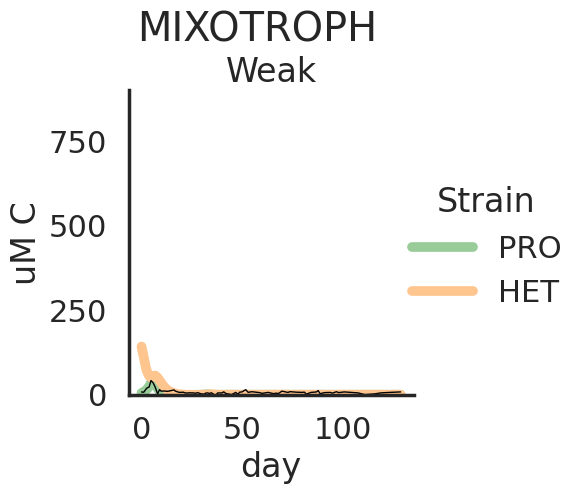

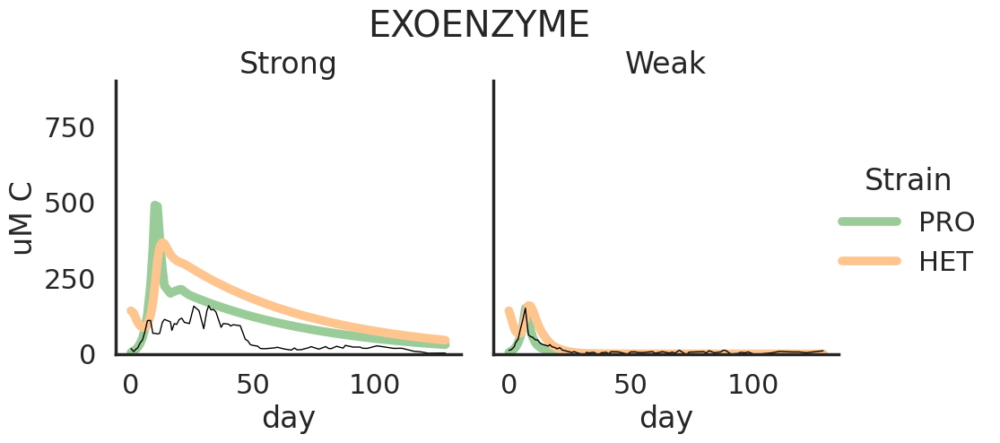

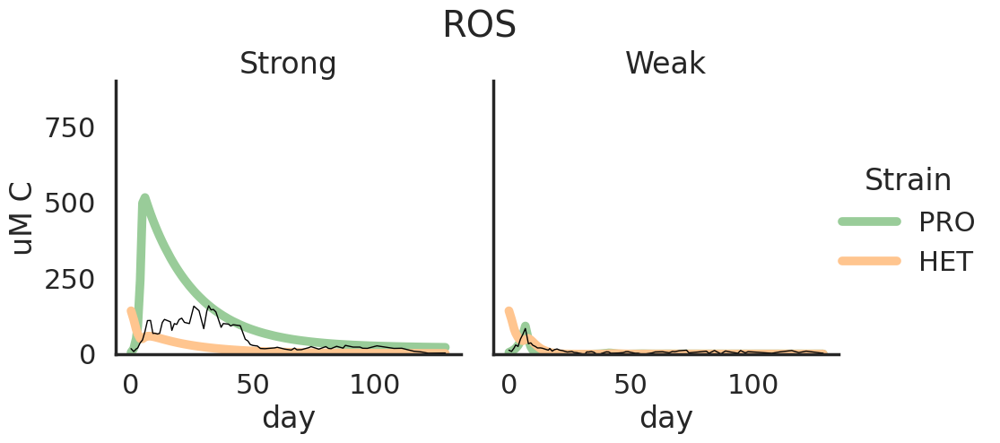

In [86]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
for m in morder:
    g = sns.relplot(
        data=mbestdf.loc[mbestdf.model.isin([m]) & mbestdf.y_pred.isin(['Strong', 'Weak'])],
        x='day',
        y='uM C',
        hue='Strain', hue_order=['PRO', 'HET'], palette=[PCOLOR, HCOLOR],
        kind='line', lw=7,
        col='y_pred', #col_order=gorder, 
        #legend=False,
            #aspect=1, height=3,
        #facet_kws=dict(margin_titles=True)
    
    ).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
    for col_val, ax in g.axes_dict.items():        
        data=mbestdf.loc[
            mbestdf.y_pred.isin([col_val]) &
            mbestdf.model.isin([m]) 
        ]
        ref_samples = set(data['Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[C]', lw=1,
                legend=False,
                color='black',
                #zorder=-1,
                ax=ax,
            )

    g.set(ylabel='uM C', ylim=(0,900))
    plt.suptitle(m, y=1.02)
    #plt.subplots_adjust(hspace=0.1, wspace=0.1)
    
    #g.set(yscale='log', ylim=(1e-1, 300))
    plt.show()

In [47]:
df.loc[df.run_id.isin(runids), var_names].describe().T

,count,mean,std,min,25%,50%,75%,max
Bp,104488.0,5.952881,12.266948,-6.651879e-11,1.456399e-01,0.591086,5.391330,92.063117
Np,104488.0,0.602959,2.080937,-1.144106e-11,1.570957e-02,0.030224,0.168356,27.943481
Cp,104488.0,16.645361,35.294935,-4.175376e-32,3.346766e-01,1.397138,14.675279,271.252621
Bh,104488.0,9.208604,13.758681,-1.705238e-10,2.596189e-01,1.518061,14.723361,91.844842
Nh,104488.0,5.823164,8.579934,-6.569506e-12,1.239474e-01,2.103006,8.726805,70.678798
Ch,104488.0,0.319540,1.768179,-1.885387e-11,1.495012e-20,0.006221,0.061451,123.227959
DON,104488.0,27.646469,27.305218,1.471479e-04,2.193896e+00,20.791752,45.245429,105.175159
RDON,104488.0,74.895059,39.628872,0.000000e+00,4.122207e+01,81.160385,108.417547,132.462317
DIN,104488.0,8.335150,24.940500,1.611692e-10,7.902180e-04,0.003704,0.014566,101.433657
DOC,104488.0,3.455435,36.656381,8.534108e-06,1.538319e-03,0.004363,0.014959,737.939271


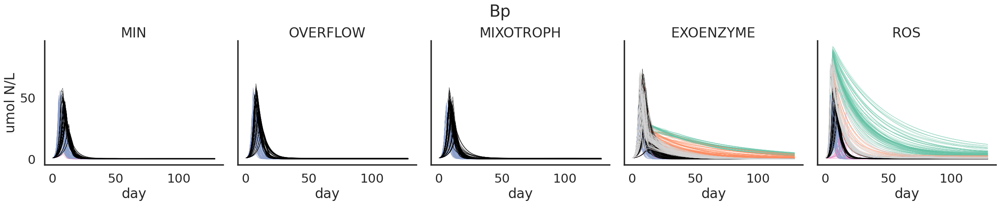

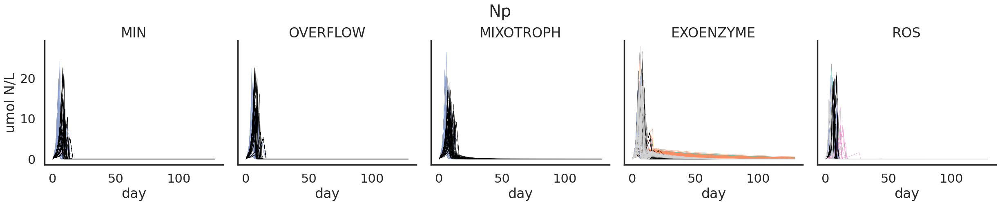

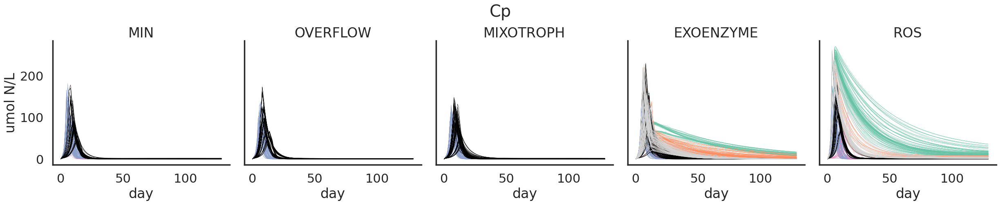

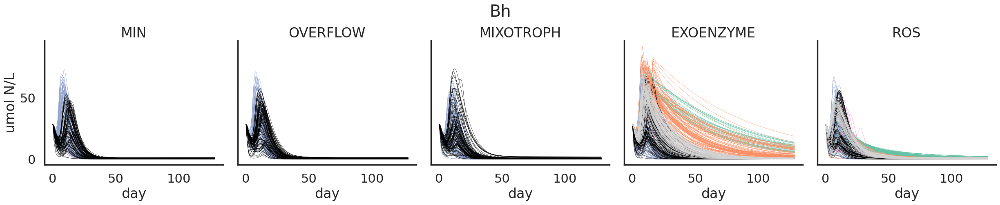

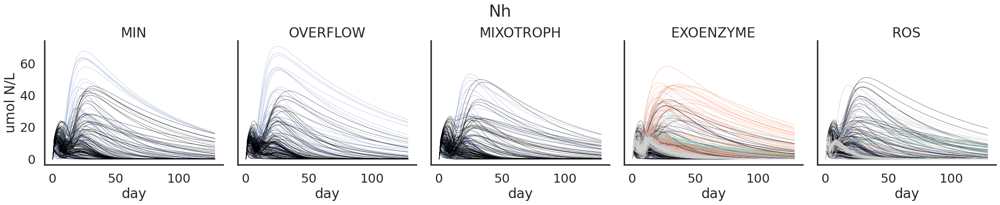

...

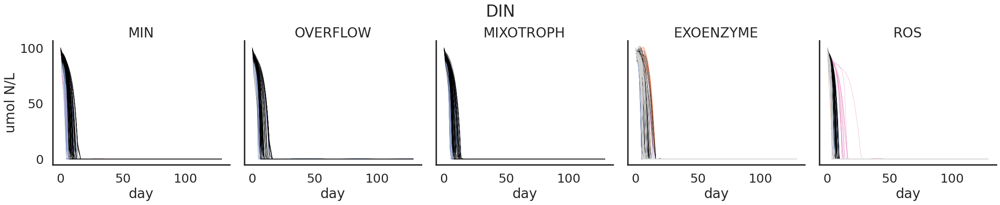

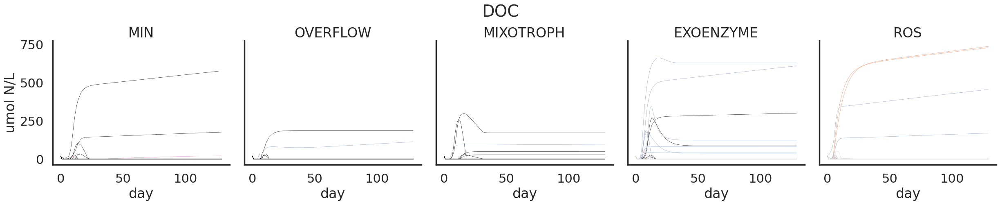

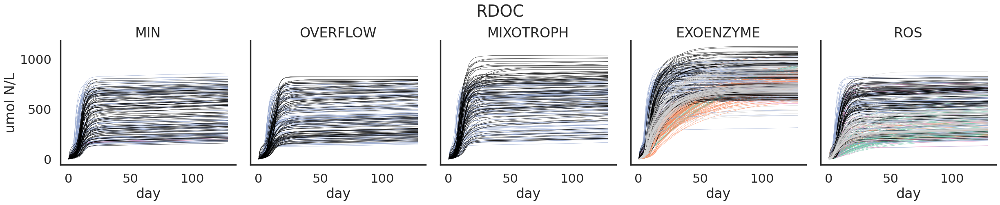

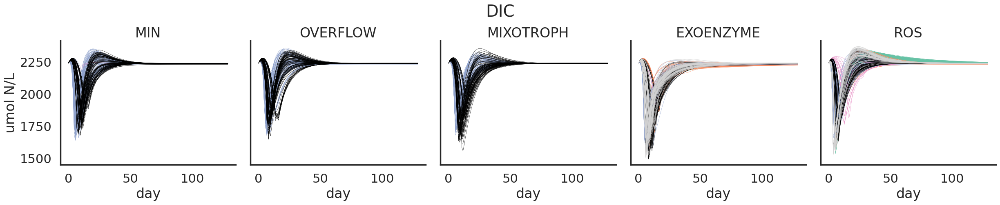

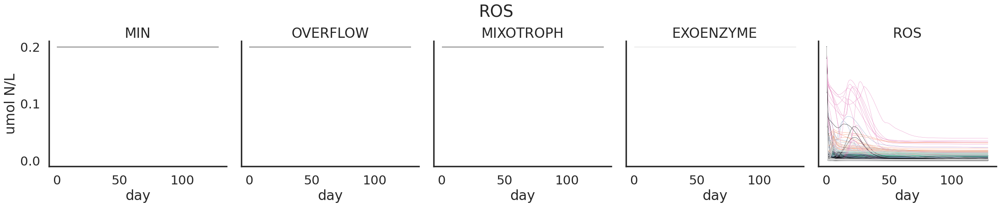

In [40]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
for v in var_names:
    g = sns.relplot(
        data=df.loc[df.run_id.isin(runids)],
        x='day',
        y=v,
        hue='y_pred', hue_order=gorder,
        kind='line', lw=0.4,
        estimator=None, units='run_id', palette=gpalette,
        col='model', col_order=morder, #col_wrap=3,
        legend=False,
            #aspect=1, height=3,
        #facet_kws=dict(margin_titles=True)

    ).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
    g.set(ylabel='umol N/L')
    plt.suptitle(v, y=1.04)
    #plt.subplots_adjust(hspace=0.1, wspace=0.1)

    #g.set(yscale='log', ylim=(1e-1, 300))
    plt.show()

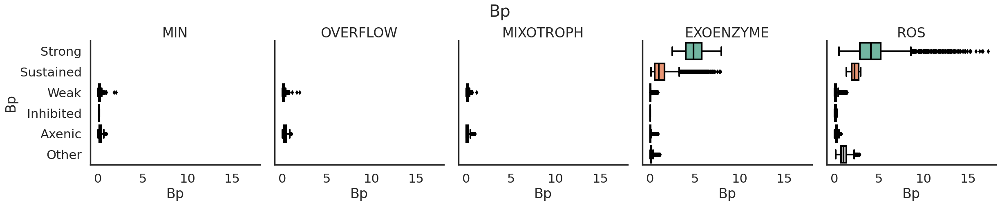

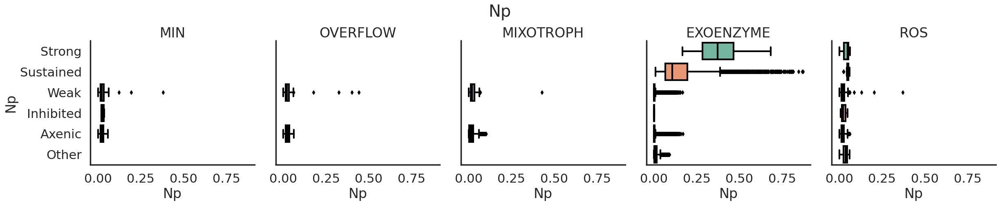

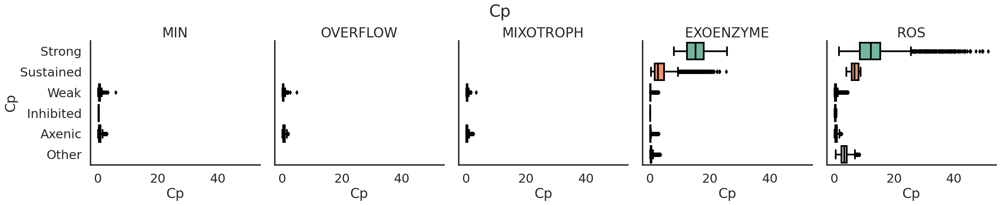

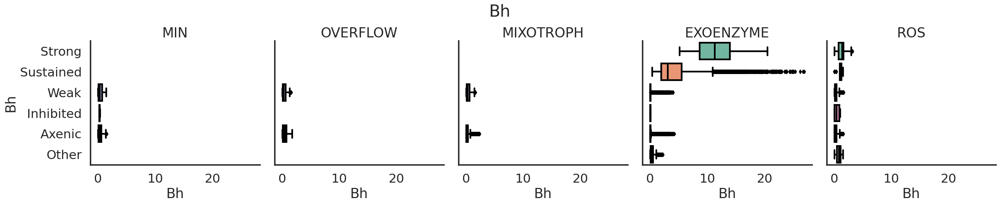

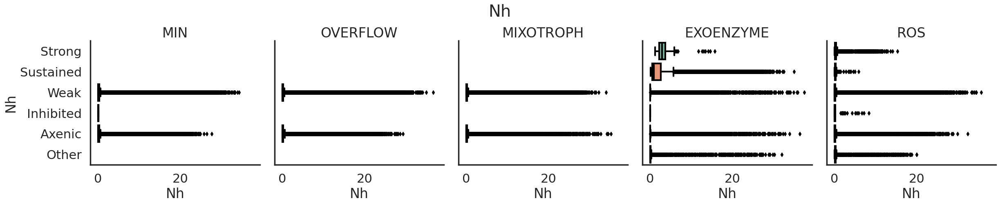

...

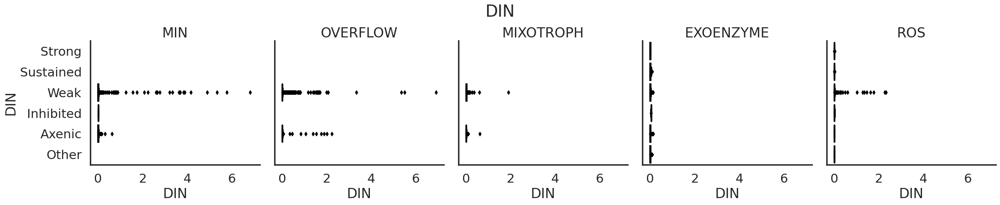

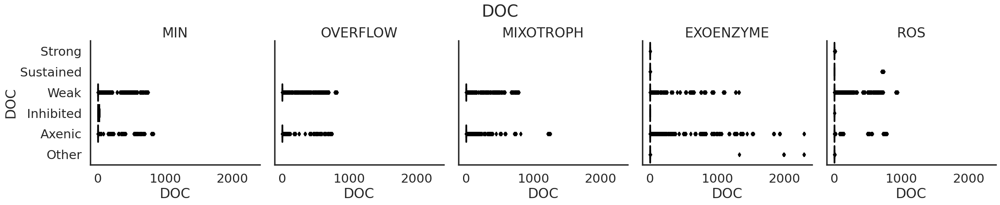

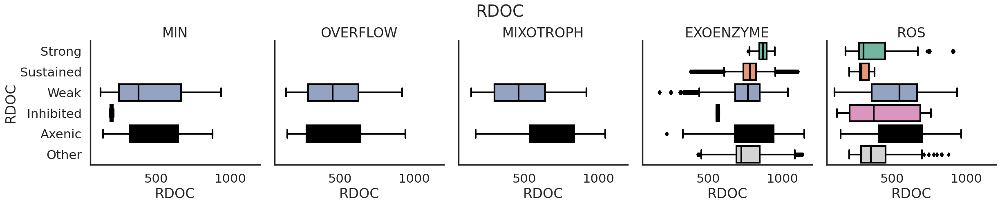

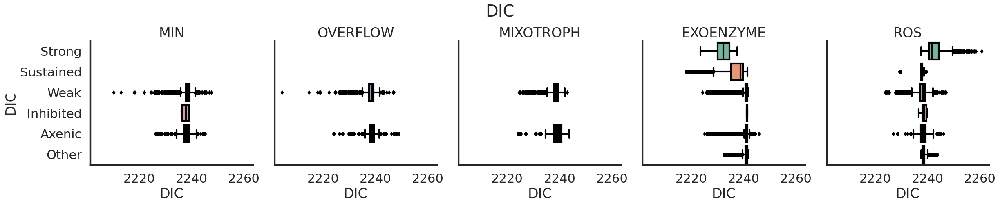

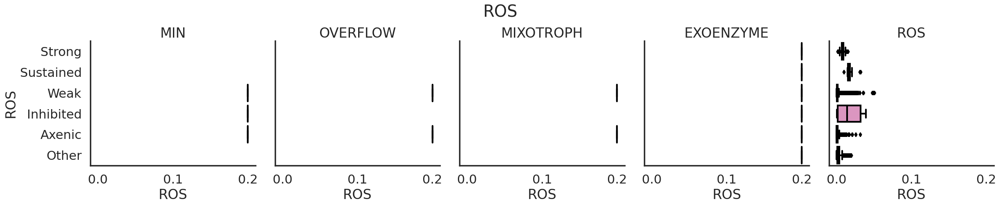

In [48]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
for v in var_names:
    g = sns.catplot(
        data=df.loc[#df.run_id.isin(runids) &
                    df.day.ge(100)],
        y='y_pred', order=gorder,
        x=v,
        hue='y_pred', hue_order=gorder,
        palette=gpalette,
        col='model', col_order=morder, #col_wrap=3,
        legend=False,
            #aspect=1, height=3,
        #facet_kws=dict(margin_titles=True)
        kind='box', dodge=False,

    ).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
    g.set(ylabel=v)
    plt.suptitle(v, y=1.04)
    #plt.subplots_adjust(hspace=0.1, wspace=0.1)

    #g.set(yscale='log', ylim=(1e-1, 300))
    plt.show()

In [22]:
runids.nunique()

1412

In [23]:
sample_df = df.loc[df.run_id.isin(runids)]
#sample_df = sample_df.merge(df_predicted_classes, on=['run_id', 'model'], how='left')
sample_df

,run_id,y_pred,max_prob,idx,media,which,model,hash,VPRO,VPRO_cluster,...,RMSE_Bptotal[N],RMSE_Bptotal[C],compare_points,RMSE,RMSE_filled,Bptotal[N],Bptotal[C],Bhtotal[N],Bhtotal[C],day
296,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,...,10.77702,70.798705,74.0,762.999051,762.999051,0.892857,5.915179,28.571429,142.857143,0.000000
297,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,...,10.77702,70.798705,74.0,762.999051,762.999051,1.192797,8.547906,32.301142,130.323829,1.081944
298,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,...,10.77702,70.798705,74.0,762.999051,762.999051,1.512199,10.838408,29.007007,106.692939,2.164583
299,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,...,10.77702,70.798705,74.0,762.999051,762.999051,1.717896,12.312756,27.365280,97.071164,2.747222
300,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,...,10.77702,70.798705,74.0,762.999051,762.999051,2.141515,15.348977,24.744004,84.805225,3.754167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3651155,monte_ROS_9_monte_vpro_90_89_ROS_C0_94_lowN_al...,Other,0.669145,monte_ROS_9_monte_vpro_90_89_ROS_C0_94,lowN,all,ROS,h-8660846992299669535,vpro_90_89_ROS_C0,C0,...,NaN,NaN,NaN,NaN,0.000000,0.529314,5.022032,0.420814,1.686538,110.943750
3651156,monte_ROS_9_monte_vpro_90_89_ROS_C0_94_lowN_al...,Other,0.669145,monte_ROS_9_monte_vpro_90_89_ROS_C0_94,lowN,all,ROS,h-8660846992299669535,vpro_90_89_ROS_C0,C0,...,NaN,NaN,NaN,NaN,0.000000,0.524968,4.980778,0.417245,1.672237,115.845833
3651157,monte_ROS_9_monte_vpro_90_89_ROS_C0_94_lowN_al...,Other,0.669145,monte_ROS_9_monte_vpro_90_89_ROS_C0_94,lowN,all,ROS,h-8660846992299669535,vpro_90_89_ROS_C0,C0,...,NaN,NaN,NaN,NaN,0.000000,0.522403,4.956438,0.415156,1.663863,118.788889
3651158,monte_ROS_9_monte_vpro_90_89_ROS_C0_94_lowN_al...,Other,0.669145,monte_ROS_9_monte_vpro_90_89_ROS_C0_94,lowN,all,ROS,h-8660846992299669535,vpro_90_89_ROS_C0,C0,...,NaN,NaN,NaN,NaN,0.000000,0.519825,4.931974,0.413063,1.655477,121.777778


In [24]:
sample_df.run_id.nunique(), runids.nunique()

(1412, 1412)

In [25]:
refdf['ref_Bp[N]_clip'] = refdf['ref_Bp[N]'].clip(lower=0.5)
refdf['ref_Bp[C]_clip'] = refdf['ref_Bp[C]'].clip(lower=0.5)


In [26]:
sample_df.loc[sample_df.y_pred == sample_df.Group]

,run_id,y_pred,max_prob,idx,media,which,model,hash,VPRO,VPRO_cluster,...,RMSE_Bptotal[N],RMSE_Bptotal[C],compare_points,RMSE,RMSE_filled,Bptotal[N],Bptotal[C],Bhtotal[N],Bhtotal[C],day
296,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,...,10.777020,70.798705,74.0,762.999051,762.999051,0.892857,5.915179,28.571429,142.857143,0.000000
297,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,...,10.777020,70.798705,74.0,762.999051,762.999051,1.192797,8.547906,32.301142,130.323829,1.081944
298,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,...,10.777020,70.798705,74.0,762.999051,762.999051,1.512199,10.838408,29.007007,106.692939,2.164583
299,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,...,10.777020,70.798705,74.0,762.999051,762.999051,1.717896,12.312756,27.365280,97.071164,2.747222
300,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.978219,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,vpro_13_69_EXOENZYME_C1,C1,...,10.777020,70.798705,74.0,762.999051,762.999051,2.141515,15.348977,24.744004,84.805225,3.754167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3649157,monte_ROS_9_monte_vpro_60_18_ROS_C4_75_lowN_al...,Axenic,0.902077,monte_ROS_9_monte_vpro_60_18_ROS_C4_75,lowN,all,ROS,h-8660846992299669535,vpro_60_18_ROS_C4,C4,...,3.574706,18.985294,74.0,67.866851,67.866851,0.132631,1.073974,0.037143,0.150477,110.943750
3649158,monte_ROS_9_monte_vpro_60_18_ROS_C4_75_lowN_al...,Axenic,0.902077,monte_ROS_9_monte_vpro_60_18_ROS_C4_75,lowN,all,ROS,h-8660846992299669535,vpro_60_18_ROS_C4,C4,...,3.574706,18.985294,74.0,67.866851,67.866851,0.131410,1.064087,0.036801,0.149091,115.845833
3649159,monte_ROS_9_monte_vpro_60_18_ROS_C4_75_lowN_al...,Axenic,0.902077,monte_ROS_9_monte_vpro_60_18_ROS_C4_75,lowN,all,ROS,h-8660846992299669535,vpro_60_18_ROS_C4,C4,...,3.574706,18.985294,74.0,67.866851,67.866851,0.130682,1.058194,0.036597,0.148265,118.788889
3649160,monte_ROS_9_monte_vpro_60_18_ROS_C4_75_lowN_al...,Axenic,0.902077,monte_ROS_9_monte_vpro_60_18_ROS_C4_75,lowN,all,ROS,h-8660846992299669535,vpro_60_18_ROS_C4,C4,...,3.574706,18.985294,74.0,67.866851,67.866851,0.129947,1.052244,0.036391,0.147431,121.777778


In [27]:
sample_df.run_id.nunique(), runids.nunique()

(1412, 1412)

In [28]:
sns.choose_cubehelix_palette ()

interactive(children=(IntSlider(value=9, description='n_colors', max=16, min=2), FloatSlider(value=0.0, descri…

[[0.9312692223325372, 0.8201921796082118, 0.7971480974663592],
 [0.8888663743660877, 0.7106793139856472, 0.7158661451411206],
 [0.8314793143949643, 0.5987041921652179, 0.6530062709235388],
 [0.7588951019517731, 0.49817117746394224, 0.6058723814510268],
 [0.6672565752652589, 0.40671838146419587, 0.5620016466433286],
 [0.5529215689527474, 0.3217924564263954, 0.5093718054521851],
 [0.43082755198027817, 0.24984535814964698, 0.44393960899639856],
 [0.29794615023641036, 0.18145907625614888, 0.35317781405034754],
 [0.1750865648952205, 0.11840023306916837, 0.24215989137836502]]

In [29]:
greenpalette = sns.light_palette(PCOLOR, n_colors=12 )[2:]
orangepalette = sns.light_palette(HCOLOR, n_colors=12 )[2:]


In [30]:
data=sample_df.loc[
    sample_df.y_pred.isin(['Weak']) &
    sample_df.model.isin(['MIN']) 
]
data
set(data.loc[data.y_pred == data.Group, 'Sample'].mode())


{'10C0'}

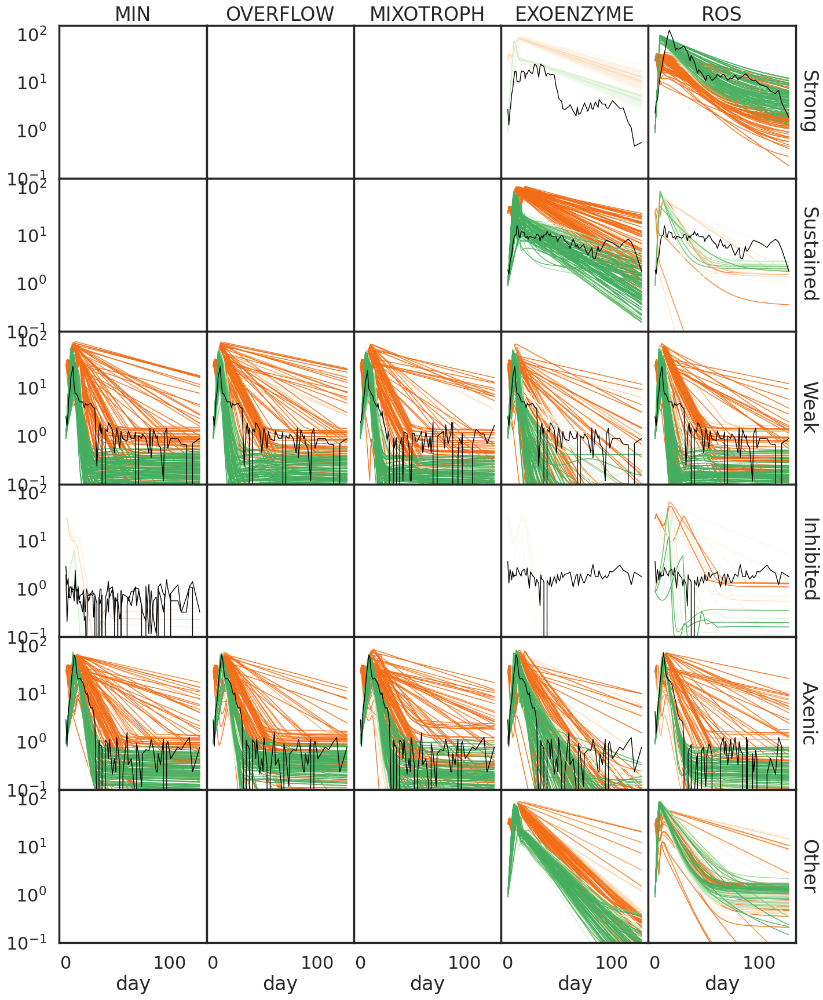

In [31]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='max_prob',palette='Greens',
        x='day', y=f'Bptotal[N]', lw=1, #alpha=0.5,
        row='y_pred',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True, despine=False),
        legend=False,
        hue_norm=(0.5,1.3),
        height=3, aspect=1,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        data=sample_df.loc[
            sample_df.y_pred.isin([row_val]) &
            sample_df.model.isin([col_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=data,
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                hue='max_prob', palette='Oranges',
                x='day', y=f'Bhtotal[N]', lw=1,
                #alpha=0.5,
                legend=False,
                hue_norm=(0.5,1.3),
                
                zorder=-1,
                ax=ax,
            )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[N]', lw=1,
                legend=False,
                color='black',
                #zorder=-1,
                ax=ax,
            )
            
    g.set(yscale='log', ylim=(1e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='N biomass (umol/L)')
    g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

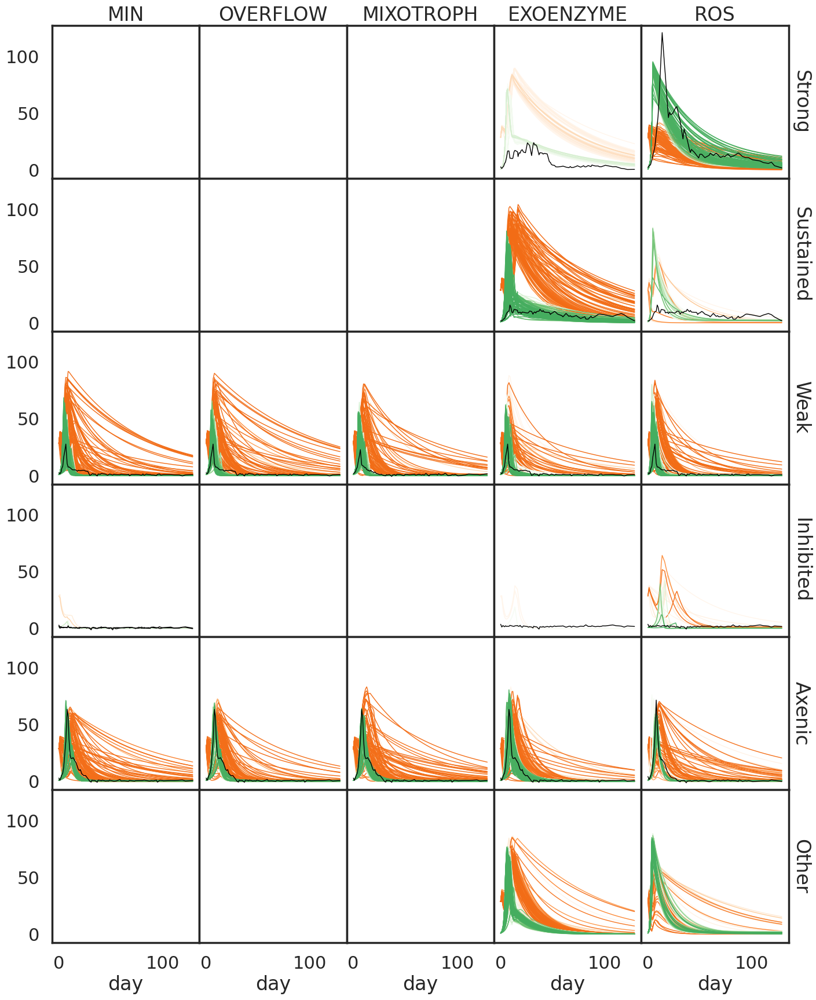

In [32]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='max_prob',palette='Greens',
        x='day', y=f'Bptotal[N]', lw=1, #alpha=0.5,
        row='y_pred',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True, despine=False),
        legend=False,
        hue_norm=(0.5,1.3),
        height=3, aspect=1,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        data=sample_df.loc[
            sample_df.y_pred.isin([row_val]) &
            sample_df.model.isin([col_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=data,
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                hue='max_prob', palette='Oranges',
                x='day', y=f'Bhtotal[N]', lw=1,
                #alpha=0.5,
                legend=False,
                hue_norm=(0.5,1.3),
                
                zorder=-1,
                ax=ax,
            )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[N]', lw=1,
                legend=False,
                color='black',
                #zorder=-1,
                ax=ax,
            )
            
    #g.set(yscale='log', ylim=(1e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='N biomass (umol/L)')
    g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
minmse_df.loc[minmse_df.reset_index().groupby(['model', 'y_pred'])['max_prob'].idxmax()][['y_pred', 'Group']].value_counts().reset_index()

In [ ]:
minmse_df.loc[minmse_df.y_pred == minmse_df.Group].pivot_table(index='model', columns='y_pred', values='RMSE', aggfunc=['count','mean', 'std'])

In [ ]:
runids2 =minmse_df.loc[minmse_df.reset_index().groupby(['model', 'y_pred'])['max_prob'].idxmax(), 'run_id']

#runids2 = minmse_df.groupby(['model',  'y_pred', ])['run_id'].sample(1, replace=True)
sample_df2 = df.loc[df.run_id.isin(runids2)]


In [ ]:
    g = sns.relplot(
        data=sample_df2,
        kind='line', 
        estimator=None, units='run_id',
        hue='y_pred', palette=gpalette, hue_order=gorder,
        #hue='max_prob',palette='Greens',
        
        x='day', y=f'Bptotal[N]', #lw=1, #alpha=0.5,
        col='y_pred',  col_order=gorder,
        #col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        #hue_norm=(0.5,1.5),
        #height=3, aspect=1,
    )
    for col_val, ax in g.axes_dict.items():        
        data=sample_df2.loc[
            sample_df2.y_pred.isin([col_val]) #&
            #sample_df2.model.isin([col_val]) 
        ]
#         if data.shape[0]>0:
#             sns.lineplot(
#                 data=data,
#                 estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 hue='max_prob', palette='Oranges',
#                 x='day', y=f'Bhtotal[N]', lw=1,
#                 #alpha=0.5,
#                 legend=False,
#                 hue_norm=(0.5,2),
                
#                 zorder=-1,
#                 ax=ax,
#             )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[N]', lw=1,
                legend=False,
                color='darkgrey',
                #zorder=-1,
                ax=ax,
            )
            
    g.set(yscale='log', ylim=(1e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    #plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='N biomass (uM N)')
    #g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
runids2 =minmse_df.loc[minmse_df.reset_index().groupby(['y_pred'])['max_prob'].idxmax(), 'run_id']

#runids2 = minmse_df.groupby(['model',  'y_pred', ])['run_id'].sample(1, replace=True)
sample_df2 = df.loc[df.run_id.isin(runids2)]


In [ ]:
    g = sns.relplot(
        data=sample_df2,
        kind='line', 
        estimator=None, units='run_id',
        hue='y_pred', palette=gpalette, hue_order=gorder,
        #hue='max_prob',palette='Greens',
        
        x='day', y=f'Bptotal[N]', lw=6, #alpha=0.5,
        col='y_pred',  col_order=gorder,
        #col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        #hue_norm=(0.5,1.5),
        #height=3, aspect=1,
    )
    for col_val, ax in g.axes_dict.items():        
        data=sample_df2.loc[
            sample_df2.y_pred.isin([col_val]) #&
            #sample_df2.model.isin([col_val]) 
        ]
#         if data.shape[0]>0:
#             sns.lineplot(
#                 data=data,
#                 estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 hue='max_prob', palette='Oranges',
#                 x='day', y=f'Bhtotal[N]', lw=1,
#                 #alpha=0.5,
#                 legend=False,
#                 hue_norm=(0.5,2),
                
#                 zorder=-1,
#                 ax=ax,
#             )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[N]', lw=1,
                legend=False,
                color='#636363',
                #zorder=-1,
                ax=ax,
            )
            
    g.set(yscale='log', ylim=(1e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    #plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='N biomass (uM N)')
    #g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
    g = sns.relplot(
        data=sample_df2,
        kind='line', 
        estimator=None, units='run_id',
        hue='y_pred', palette=gpalette, hue_order=gorder,
        #hue='max_prob',palette='Greens',
        
        x='day', y=f'Bptotal[N]', lw=6, #alpha=0.5,
        col='y_pred',  col_order=gorder,
        #col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        #hue_norm=(0.5,1.5),
        #height=3, aspect=1,
    )
    for col_val, ax in g.axes_dict.items():        
        data=sample_df2.loc[
            sample_df2.y_pred.isin([col_val]) #&
            #sample_df2.model.isin([col_val]) 
        ]
#         if data.shape[0]>0:
#             sns.lineplot(
#                 data=data,
#                 estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 hue='max_prob', palette='Oranges',
#                 x='day', y=f'Bhtotal[N]', lw=1,
#                 #alpha=0.5,
#                 legend=False,
#                 hue_norm=(0.5,2),
                
#                 zorder=-1,
#                 ax=ax,
#             )
        ref_samples = set(data.loc[data.y_pred == data.Group, 'Sample'].mode())
        
        if ref_samples:
            sns.lineplot(
                data=refdf.loc[refdf.Sample.isin(ref_samples)],
                estimator=None, units='Sample',
                x='day', y=f'ref_Bp[N]', lw=1,
                legend=False,
                color='#636363',
                #zorder=-1,
                ax=ax,
            )
            
#    g.set(yscale='log', ylim=(1e-1, 150))
    #sns.despine(top=False, right=False, left=False, bottom=False)
    #g.set(ylim=(0, 150))
    #plt.subplots_adjust(hspace=0, wspace=0)
            
    g.set(ylabel='N biomass (uM N)')
    #g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
gpalette

In [ ]:
sns.color_palette(sns.color_palette('Greens', n_colors=1) + sns.color_palette('Oranges',n_colors=1))


In [ ]:
ref_meta = refdf.loc[~refdf['train_Group'].isin(['Other'])][['train_Group','full name']].value_counts().reset_index()
ref_meta['train_Group'] = pd.Categorical(ref_meta['train_Group'], categories=gorder)
ref_meta = ref_meta.sort_values(by=['train_Group','full name'])
ref_meta

In [ ]:
    g = sns.relplot(
        data=refdf.loc[~refdf['train_Group'].isin(['Other'])],
        kind='line', 
        x='day', y='ref_Bp[N]_clip',
        units='Sample', estimator=None, 
        hue='train_Group', palette=gpalette, hue_order=gorder,
        col='full name', col_wrap=6, col_order=ref_meta['full name'],
        #facet_kws=dict( margin_titles=True),
        #legend=False,
        height=4, aspect=1.3,
    )
    g.set(yscale='log', ylim=(1e-1, 1000))
    #plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    g.set(ylabel='N biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')